In [2]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import math
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F
import random

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

C:\Users\HP\AppData\Local\Temp\ipykernel_15580\62374413.py:9: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [3]:
# importing the image
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

dog.jpg exists


torch.Size([3, 1365, 2048])


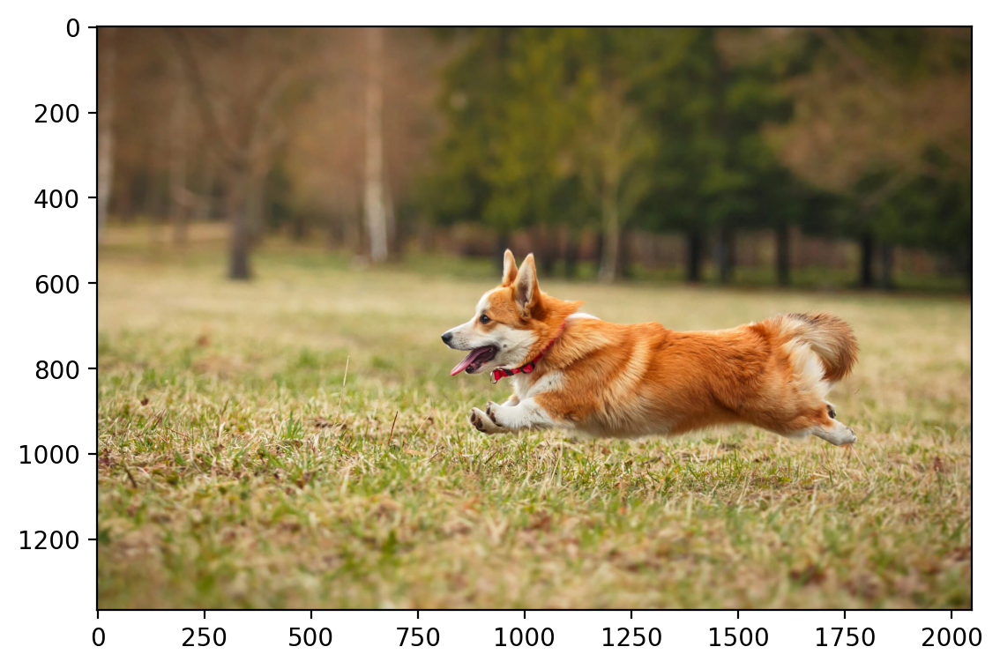

In [4]:
img = torchvision.io.read_image("dog.jpg")
print(img.shape)
plt.imshow(rearrange(img, 'c h w -> h w c'))

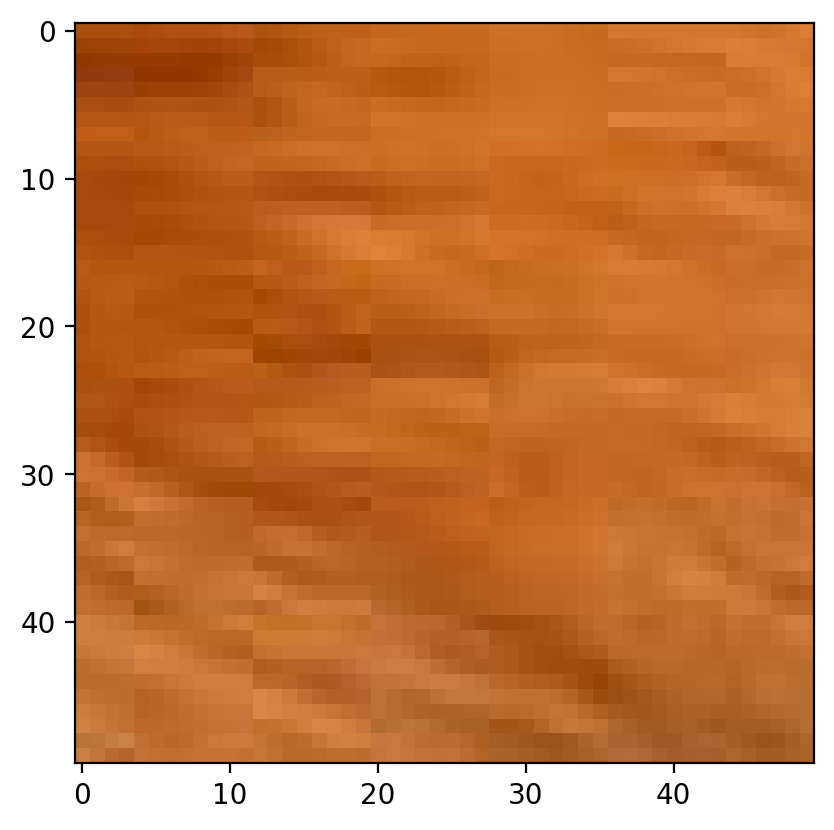

In [5]:
# img[:, X_mid-5*N_size:X_mid+5*N_size, Y_mid-5*N_size:Y_mid+5*N_size] // 
# X_mid, Y_mid = 700, 850 and N_size = 30

crop = img[:, 800:850, 1300:1350]
plt.imshow(rearrange(crop, 'c h w -> h w c'))

5c_a) Reconstruct the image in the following two cases, where your region is-
a rectangular block of 30X30 is assumed missing from the image.
a random subset of 900 (30X30) pixels is missing from the image.
Choose rank r yourself. Perform Alternating least squares till convergence, plot the selected regions, original and reconstructed images, compute the metrics and write your observations. Obtain the reconstruction using RFF + Linear regression and compare the two.

In [6]:
# a rectangular block of 30X30 (patch sie = 30) is assumed missing from the image (patch center is (X_mid, Y_mid)).
def mask_image_structured(img, location, patch_size):
    masked_img = img.clone().float()
    mask = torch.zeros_like(img, dtype=torch.bool)
    x_start = location[0] - int(patch_size/2)
    y_start = location[1] - int(patch_size/2)
    x_end = x_start + patch_size
    y_end = y_start + patch_size
    mask[:, x_start:x_end, y_start:y_end] = True
    masked_img[mask] = float('nan')  # Note: This will only work if img is of floating-point dtype
    return masked_img

In [7]:
# a random subset of 900 (30X30) pixels is missing from the image.

def mask_image_unstructured(image_tensor, patch_size):
    masked_image_tensor = image_tensor.clone().float()
    _, height, width = masked_image_tensor.shape

    # Generate all possible indices and shuffle them. Take the first 900 indices
    indices = [(x, y) for x in range(height) for y in range(width)]
    random.shuffle(indices)
    selected_indices = indices[:patch_size*patch_size]
    random_x = [x for x, _ in selected_indices]
    random_y = [y for _, y in selected_indices]
    masked_image_tensor[:, random_x, random_y] = float('nan')
    return masked_image_tensor

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


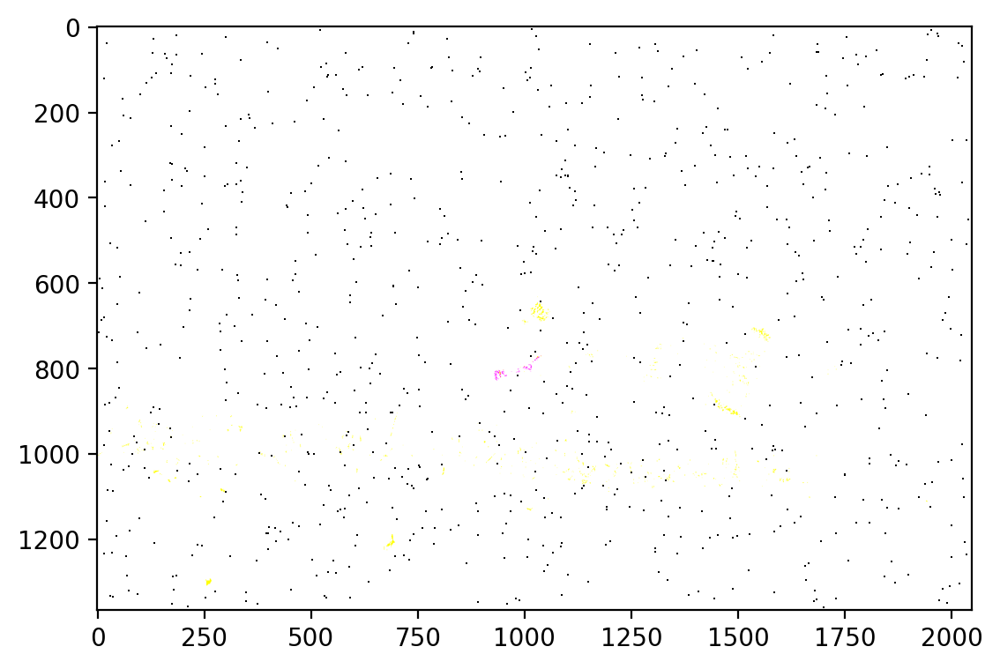

In [8]:
masked_image = mask_image_unstructured(img, 30)
plt.imshow(rearrange(masked_image, 'c h w -> h w c'))

In [9]:
# Modify the loss function to ignore NaN values

import torch.optim as optim

def factorize_als(A, k, device=torch.device("cpu"),tol=1e-6,max_iter=1000):
    m,n=A.shape
    A = A.to(device)
    # Randomly initialize W
    W = torch.randn(m, k, device=device)
    H = torch.randn(k, n, device=device)
    prev_loss=float('inf')

    #Mask out Nan values in A
    mask = ~torch.isnan(A)
    
    for _ in range(max_iter):
      
      for i in range(n):
          # Update H using least squares
          H[:, i] = torch.linalg.lstsq(W[mask[:, i],:], A[mask[:, i], i]).solution  
          # A[mask[:, i], i] = Select non-Nan entries in column i 
          # W[mask[:, i]] = Corresponding rows in W
   
      for j in range(m):
          # Update W using least squares
          W[j] = torch.linalg.lstsq(H[:,mask[j, :]].T, A[j, mask[j,:]].T).solution.T
          # A[j, mask[j,:]] = Select non-Nan entries in row j(=columns in A.T)
          # H[:,mask[j, :]] = Corresponding columns in H (=rows in H.T)

      # Compute the loss
      diff_matrix = torch.mm(W, H) - A
      diff_vector=diff_matrix[mask]
      current_loss=torch.norm(diff_vector)
      
      if torch.abs(current_loss - prev_loss) < tol:
            break
      prev_loss = current_loss

    return W, H, current_loss


In [10]:
def metrics(reconstructed_img3D, original_img):
    RMSE = torch.sqrt(((reconstructed_img3D - original_img) ** 2).mean()).item()
    if RMSE == 0:
        return 0, np.inf
    PSNR = 10 * (math.log10((255)*2)/((RMSE)*2))
    return RMSE, PSNR

In [11]:
def reshaping(reconstructed_img3D):
    reconstructed_img_3D_reordered = reconstructed_img3D.permute(1, 2, 0)
    reconstructed_img_np = reconstructed_img_3D_reordered.detach().cpu().numpy()

    # to get all the values in the range [0, 255]
    reconstructed_img_scaled = reconstructed_img_np - reconstructed_img_np.min()
    reconstructed_img_scaled /= reconstructed_img_scaled.max()
    reconstructed_img_scaled *= 255

    reconstructed_img_scaled = np.uint8(reconstructed_img_scaled)
    return torch.tensor(reconstructed_img_scaled).permute(2, 0, 1)

In [12]:
def plot_reconstructed_img(reconstructed_img, original_img, RMSE, PSNR, title, N_size):    
    fig = plt.figure(figsize=(8, 4.5))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])
    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(rearrange(reconstructed_img, 'c h w -> h w c'))
    # ax0.set_title(f"Reconstructed Image [Removed patch size = {N_size}*{N_size}]")
    ax0.set_title(f"Reconstructed Image")
    ax1.imshow(rearrange(original_img, 'c h w -> h w c'))
    ax1.set_title(f"Original Image")
    for a in [ax0, ax1]:
        a.axis("off")

    plt.suptitle(title, weight='bold')
    fig.subplots_adjust(top=1.0)  # Adjust the vertical position of the super title
    fig.text(0.5, 0.01, f"RMSE = {RMSE:.2f}, PSNR = {PSNR:.2f}", ha='center', weight='bold')
    plt.tight_layout()

In [13]:
def reconstruct_img(img, k, N_size, X_mid, Y_mid, title, rect_patch):

    crop = img[:, X_mid-5*40:X_mid+5*40, Y_mid-5*40:Y_mid+5*40]
    
    if rect_patch:  # a.structured 
        masked_img = mask_image_structured(crop, (5*40, 5*40), N_size)
    else:           # b.unstructured
        masked_img = mask_image_unstructured(crop, N_size)

    # convert masked image into a 2D tensor to factorise
    masked_img_2D = masked_img.reshape(-1, masked_img.size(-1))
    W, H, loss = factorize_als(masked_img_2D, k, device=device)
    reconstructed_img = torch.mm(W, H)

    # convert the reconstructed 2D tensor to 3D tensor
    reconstructed_img3D = reconstructed_img.reshape(3, crop.shape[1], -1)

    # Reshaping and Scaling 
    reconstructed_img_scaled = reshaping(reconstructed_img3D)
    
    # calculate metrics
    RMSE, PSNR = metrics(reconstructed_img3D, crop)

    #plot reconstructed and masked image
    masked_img = masked_img.to(img.dtype)
    plot_reconstructed_img(reconstructed_img_scaled, masked_img, RMSE, PSNR, title, N_size)

    return masked_img, RMSE, PSNR

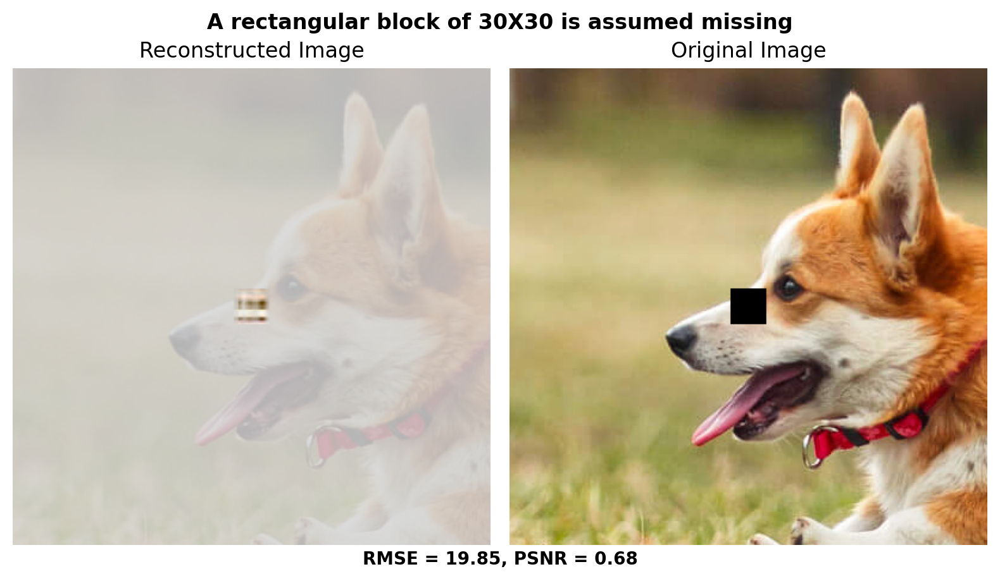

In [54]:
# a rectangular block of 30X30 is assumed missing from the image.
masked_img_a, RMSE_a, PSNR_b = reconstruct_img(img, 100, 30, 700, 875, 'A rectangular block of 30X30 is assumed missing', rect_patch=1)

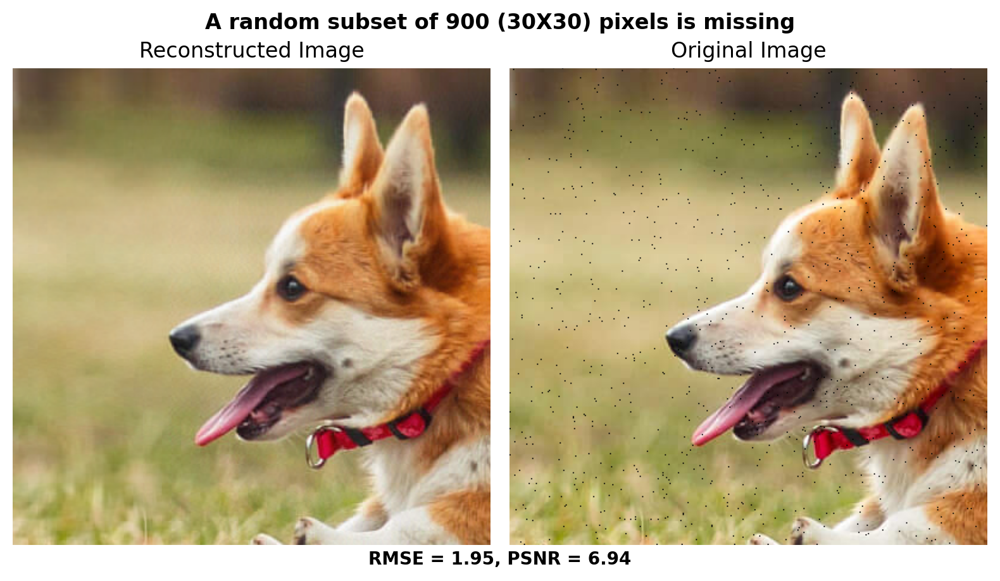

In [55]:
# a random subset of 900 (30X30) pixels is missing from the image.
masked_img_b, RMSE_b, PSNR_b = reconstruct_img(img, 100, 30, 700, 875, 'A random subset of 900 (30X30) pixels is missing', rect_patch=0)

RFF

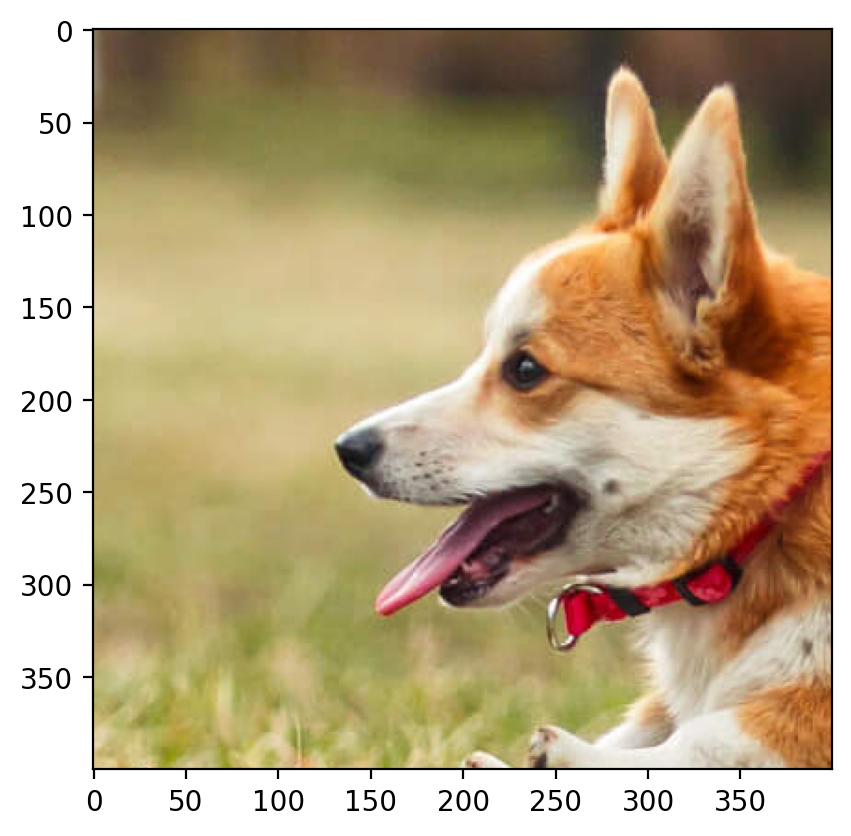

In [26]:
img = torchvision.io.read_image("dog.jpg")
img = img.float() / 255.0 
crop = torchvision.transforms.functional.crop(img, 500, 675, 400, 400)
plt.imshow(rearrange(crop, 'c h w -> h w c').numpy())

In [27]:
# create RFF features
import torch.nn as nn
import torch.nn.functional as F

def create_rff_features(X, num_features, sigma):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2),random_state=42)
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)

def create_coordinate_map(img, scale=1):
    """
    img: torch.Tensor of shape (num_channels, height, width)
    
    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """
    
    num_channels, height, width = img.shape
    
    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(0, width,  1/scale).repeat(int(height*scale), 1)
    h_coords = torch.arange(0, height, 1/scale).repeat(int(width*scale), 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    return X, Y

class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)
        
    def forward(self, x):
        return self.linear(x)
    
def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)
        
        
        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()
        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")
    return loss.item()

In [28]:

def train_and_predict_with_rff_tensor(image_tensor,device=torch.device("cpu")):
    """
    Train a model with RFF on the image tensor with missing data and predict the missing portions.
    """
    X, Y = create_coordinate_map(image_tensor)
    nan_mask_Y = torch.isnan(Y).any(dim=1)
    X_filtered = X[~nan_mask_Y]
    Y_filtered = Y[~nan_mask_Y]

    from sklearn.preprocessing import MinMaxScaler
    scaler = MinMaxScaler(feature_range=(-1, 1))
    scaled_X = scaler.fit_transform(X_filtered)
    scaled_X_filtered = torch.tensor(scaled_X, device=device)

    X_rff = create_rff_features(scaled_X_filtered, 1000, 0.08)
    
    net = LinearModel(X_rff.shape[1], 3)
    net.to(device)
    train(net, 0.005, X_rff, Y_filtered, 1000, verbose=False)
    
    scaled_X = scaler.transform(X)
    scaled_X_tensor = torch.tensor(scaled_X, device=device)
    X_rff_new = create_rff_features(scaled_X_tensor, 1000, 0.08)
    
    outputs = net(X_rff_new)
    outputs_np = outputs.detach().numpy()
    
    predicted_image_tensor = outputs_np

    return predicted_image_tensor

In [29]:
def plot_reconstructed_img_rff(reconstructed_img, masked_img,title):
    fig, axs = plt.subplots(1, 2, figsize=(8, 4))  
    predicted_image_np = np.reshape(reconstructed_img,(masked_img.shape[1],masked_img.shape[2],masked_img.shape[0]))
    axs[0].imshow(predicted_image_np)
    axs[0].set_title('Reconstructed Image using RFF')        
    axs[1].imshow(rearrange(masked_img, 'c h w -> h w c'))
    axs[1].set_title("Original Image")
    plt.suptitle(title, weight='bold')
    
    plt.tight_layout()
    plt.show()

a. A rectangular block of 30X30 is assumed missing from the image.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


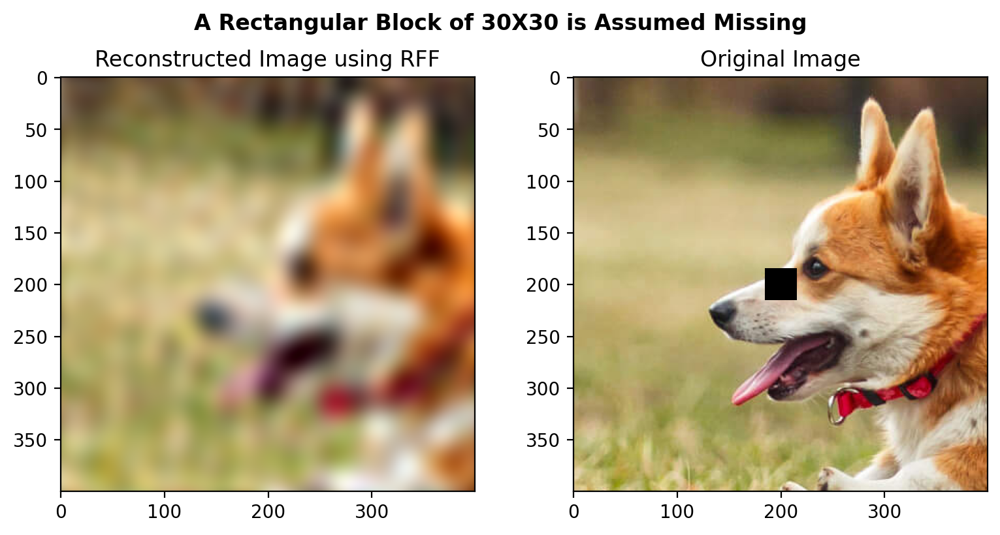

Reconstruction using RFF+Linear Regression
RMSE for structured missing regions:  0.30958423018455505
PSNR for structured missing regions:  43.729135920196086


In [30]:
masked_img = mask_image_structured(crop, (200, 200), 30)
reconstructed_img= train_and_predict_with_rff_tensor(masked_img,device=device)
plot_reconstructed_img_rff(reconstructed_img, masked_img, "A Rectangular Block of 30X30 is Assumed Missing")
predicted_image_np = torch.tensor(np.reshape(reconstructed_img,(masked_img.shape[0], masked_img.shape[1],masked_img.shape[2])))

RMSE_1, PSNR_1 = metrics(predicted_image_np ,crop)
print("Reconstruction using RFF+Linear Regression")
print("RMSE for structured missing regions: ", RMSE_1)
print("PSNR for structured missing regions: ", PSNR_1)

b. A random subset of 900 (30X30) pixels is missing from the image.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


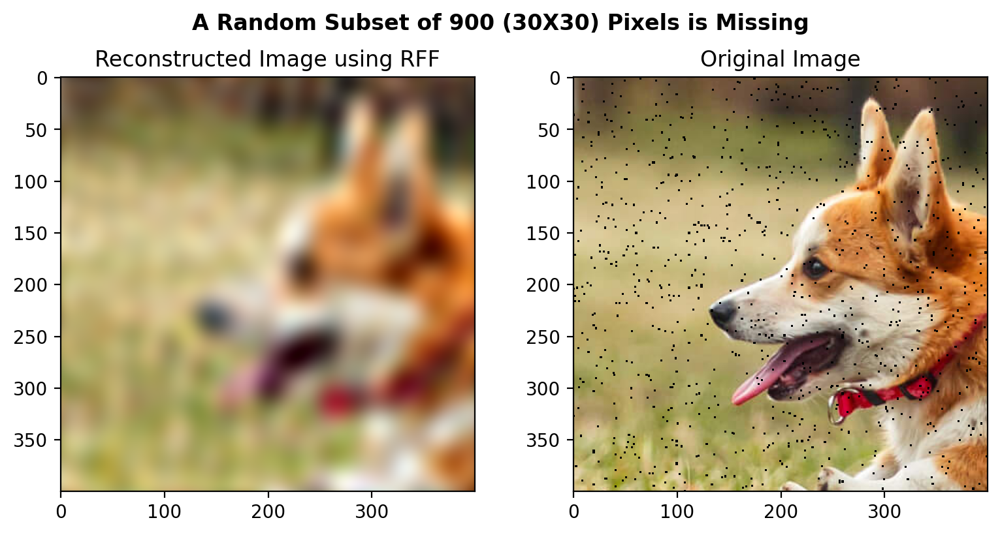

Reconstruction using RFF+Linear Regression
RMSE for unstructured missing regions:  0.3094868063926697
PSNR for unstructured missing regions:  43.742901477076764


In [31]:
masked_img = mask_image_unstructured(crop, 30)
reconstructed_img= train_and_predict_with_rff_tensor(masked_img,device=device)
plot_reconstructed_img_rff(reconstructed_img, masked_img, 'A Random Subset of 900 (30X30) Pixels is Missing')
predicted_image_np = torch.tensor(np.reshape(reconstructed_img,(masked_img.shape[0], masked_img.shape[1],masked_img.shape[2])))

RMSE_2, PSNR_2 = metrics(predicted_image_np ,crop)
print("Reconstruction using RFF+Linear Regression")
print("RMSE for unstructured missing regions: ", RMSE_2)
print("PSNR for unstructured missing regions: ", PSNR_2)

5c_b) Vary region size (NxN) for N = [20, 40, 60, 80] and perform Alternating least squares till convergence. Again, consider the two cases for your region as mentioned in Part (a). Demonstrate the variation in reconstruction quality by making appropriate plots and metrics

In [118]:
def plot_metrics(N_values, RMSE_values, PSNR_values):
    print("N_values:", N_values)
    print("RMSE_values:", RMSE_values)
    print("PSNR_values:", PSNR_values)
    fig, axs = plt.subplots(1, 2, figsize=(8, 4))  
    axs[0].plot(N_values, RMSE_values, marker='o', label='RMSE')
    axs[0].set_title('RMSE vs N size')
    axs[0].grid(True)
    axs[0].legend()
    
    axs[1].plot(N_values, PSNR_values, marker='o', label='PSNR')
    axs[1].set_title('PSNR vs N size')
    axs[1].grid(True)
    axs[1].legend()
    
    plt.tight_layout()
    plt.show()

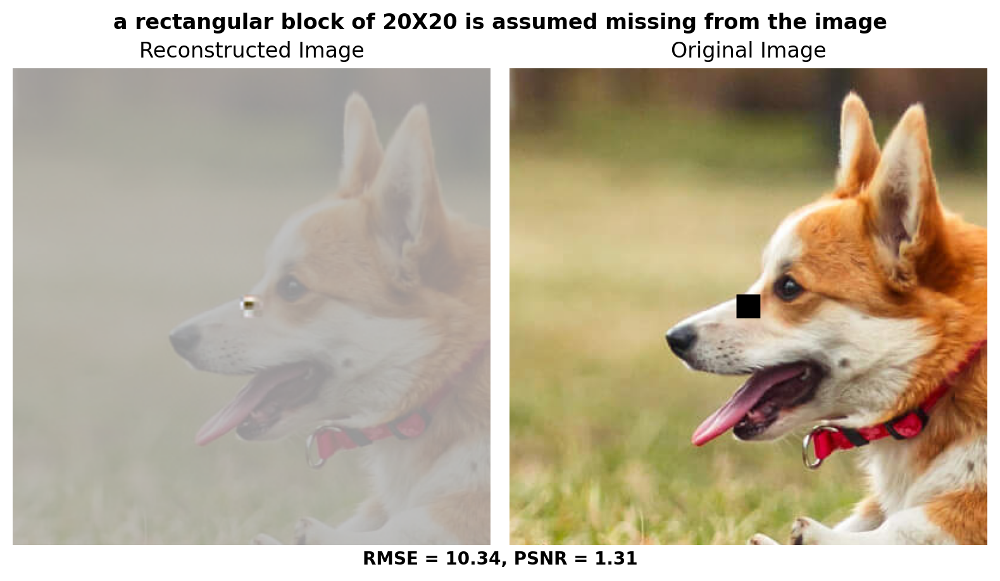

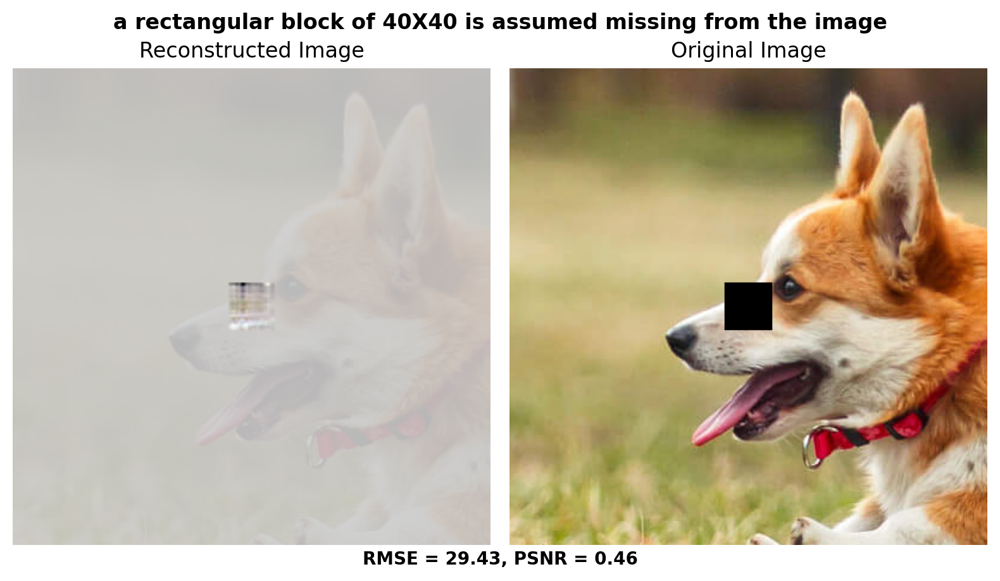

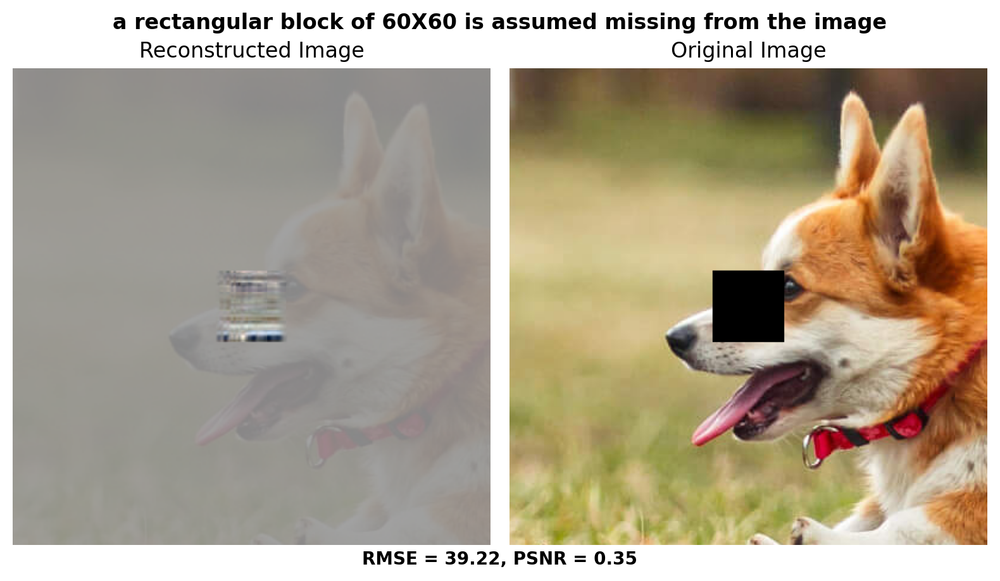

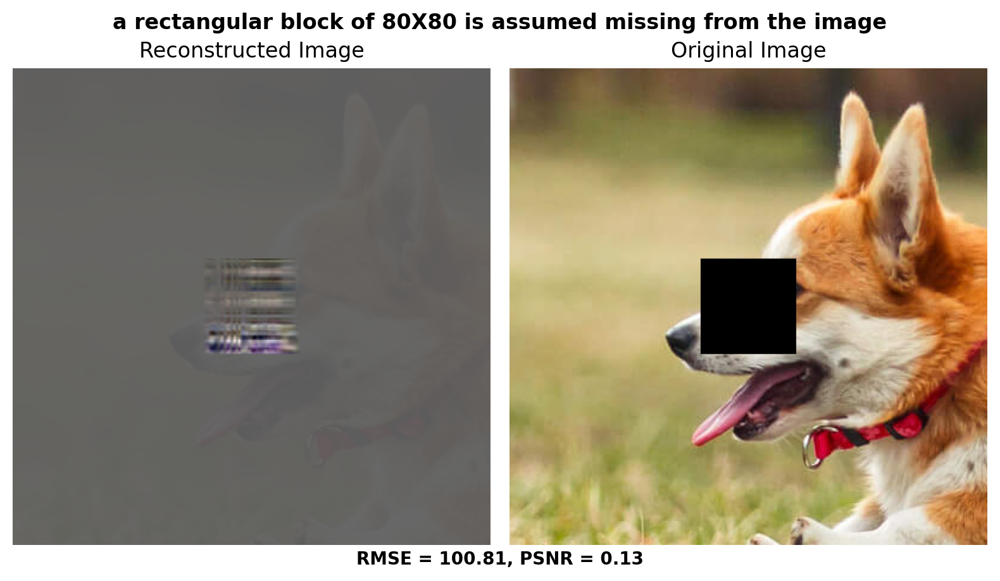

In [119]:
# A rectangular block of NXN is assumed missing from the image.
N = [20, 40, 60 ,80]
RMSE_a = []
PSNR_a = []
for i in range(4):
    size=N[i]
    masked_img_a, RMSE, PSNR = reconstruct_img(img, 100, N[i], 700, 875, f"a rectangular block of {size}X{size} is assumed missing from the image", rect_patch=1)
    RMSE_a.append(RMSE)
    PSNR_a.append(PSNR)

N_values: [20, 40, 60, 80]
RMSE_values: [10.343235969543457, 29.428028106689453, 39.224910736083984, 100.81400299072266]
PSNR_values: [1.3088602948200199, 0.4600325523480221, 0.34513401372857355, 0.13428542145812317]


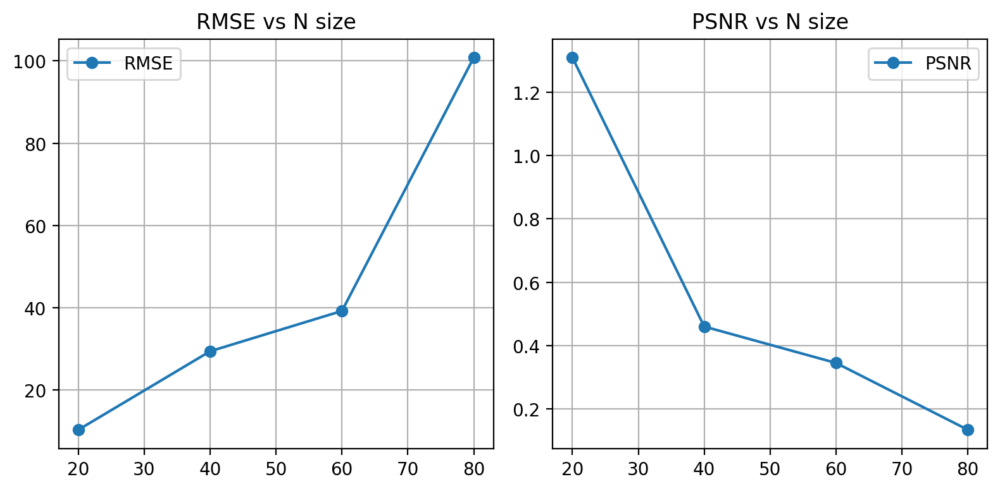

In [120]:
plot_metrics(N, RMSE_a, PSNR_a)

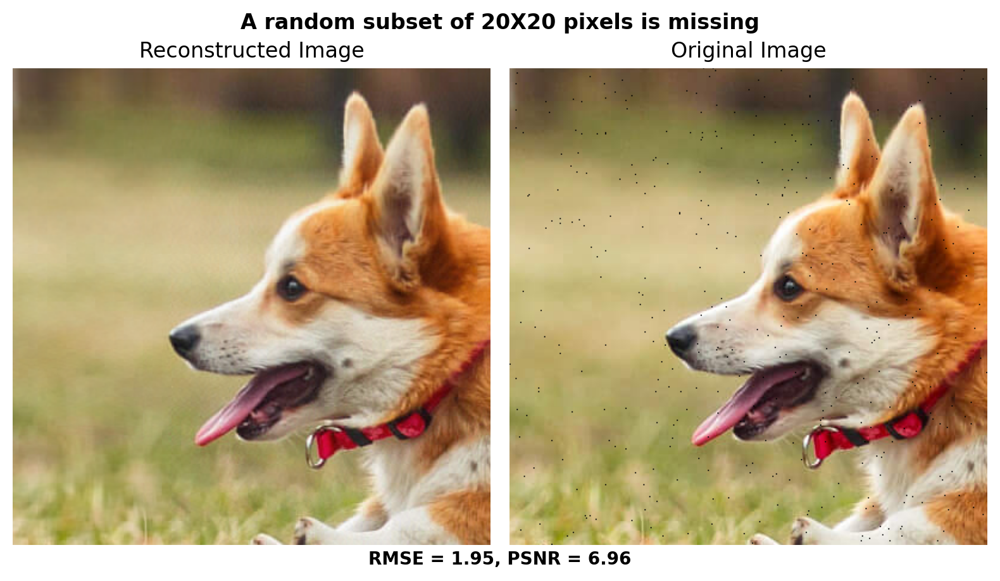

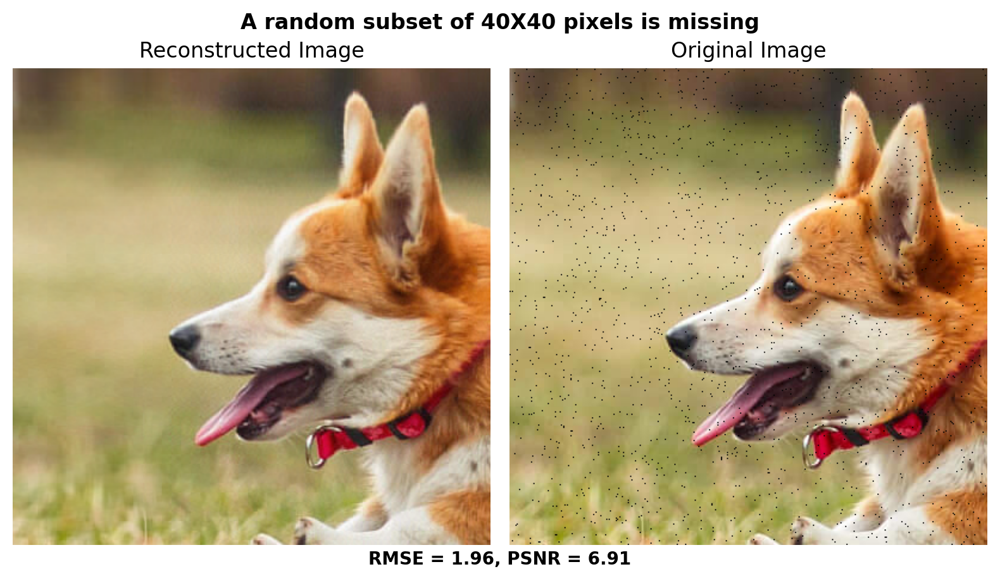

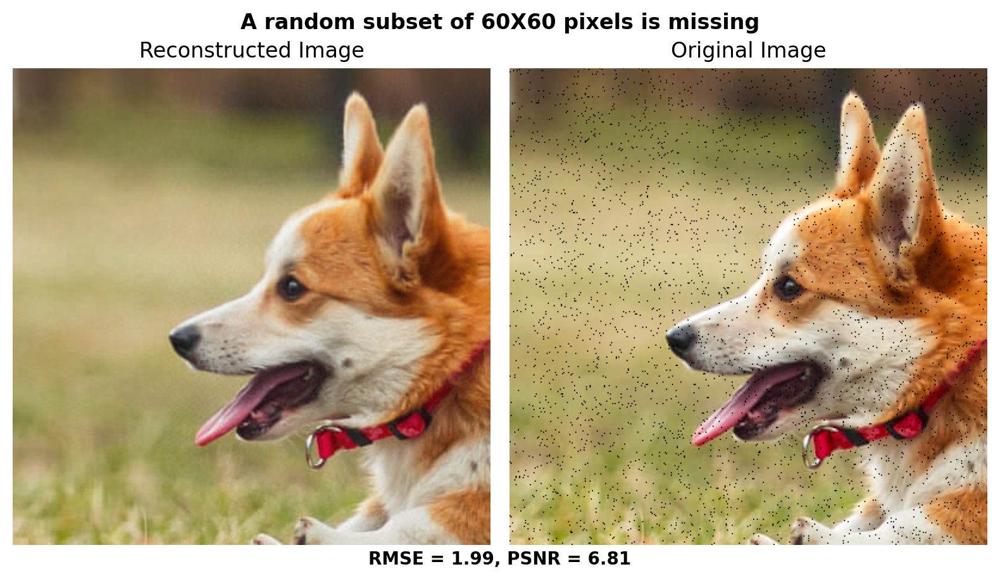

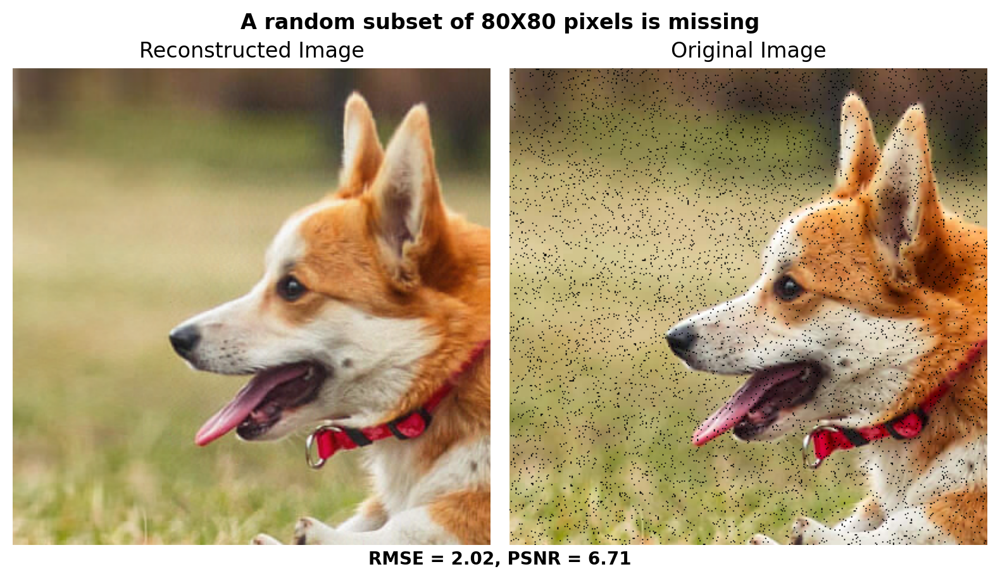

In [121]:
# A random subset of NXN is assumed missing from the image.
N = [20, 40, 60 ,80]
RMSE_b = []
PSNR_b = []
for i in range(4):
    size=N[i]
    masked_img_b, RMSE, PSNR = reconstruct_img(img, 100, N[i], 700, 875, f'A random subset of {size}X{size} pixels is missing', rect_patch=0)
    RMSE_b.append(RMSE)
    PSNR_b.append(PSNR)

N_values: [20, 40, 60, 80]
RMSE_values: [1.9462482929229736, 1.9587736129760742, 1.987685203552246, 2.0186548233032227]
PSNR_values: [6.955870394192026, 6.911391286265526, 6.810862633728832, 6.706372344696872]


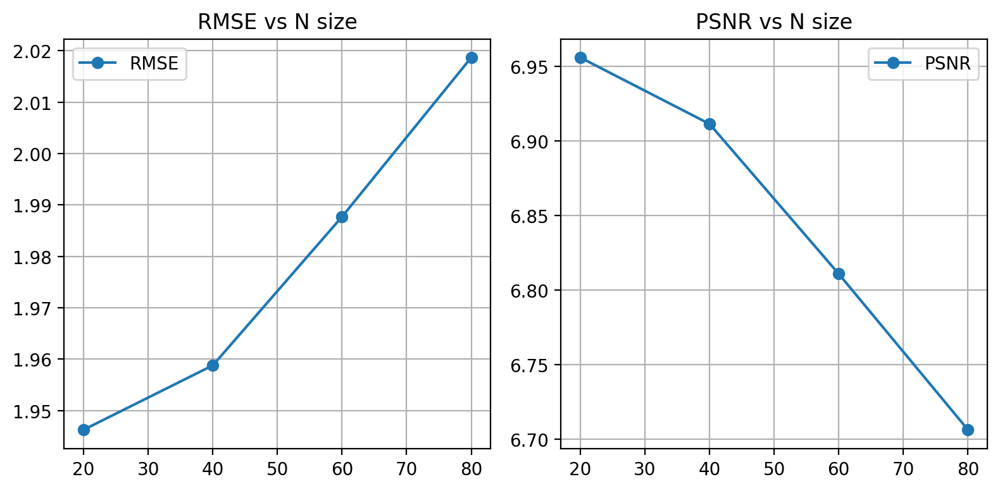

In [122]:
plot_metrics(N, RMSE_b, PSNR_b)